In [1]:
import os

os.chdir('/homes/bussotti/XFC2/code')

In [2]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

from explainable_fact_checking.charts.notebook_utility import *
from sklearn.metrics import f1_score

/home/bussotti/.conda/envs/feverous2/lib/python3.10/site-packages/spacy/util.py:910: UserWarning: [W095] Model 'en_core_web_sm' (3.1.0) was trained with spaCy v3.1.0 and may not be 100% compatible with the current version (3.7.3). If you see errors or degraded performance, download a newer compatible model or retrain your custom model with the current spaCy version. For more details and available updates, run: python -m spacy validate
  warnings.warn(warn_msg)


/home/bussotti/.conda/envs/feverous2/bin/python3


# Params

In [3]:
from ast import literal_eval

layout_dict = layout_dict | {'width': 1200}
suffix = '_v1'
class_names = xfc.experiment_definitions.E.CLASS_NAMES_V1
exp_df_0 = pd.read_csv(os.path.join(xfc.experiment_definitions.E.RESULTS_DIR, 'all_exp_v2.csv'))
exp_df_0['explainer_params__class_names'] = exp_df_0['explainer_params__class_names'].apply(literal_eval)
id_cols = ['id', 'dataset_name', 'model_name', 'explainer_name']

# select rows with goldatg == 1 or type claim
only_claim_mask = exp_df_0['type'] == 'claim_only_pred'
gold_ev_mask = exp_df_0['goldtag'] == 1
# evidence_df = explanation_df[~only_claim_mask | gold_ev_mask].copy()


exp_df_0.groupby(['dataset_name',
                  'model_name',
                  'explainer_name'
                  ])['id'].nunique()



/tmp/ipykernel_3805055/3931263207.py:6: DtypeWarning:

Columns (8) have mixed types. Specify dtype option on import or set low_memory=False.



dataset_name     model_name   explainer_name
AVERITEC         GenFCExp     lime               473
                              shap               471
                 LLAMA31_70B  lime               473
                              shap               473
                 Roberta      lime               474
                              shap               473
FM2              GenFCExp     lime              1116
                              shap              1116
                 LLAMA31_70B  lime               998
                              shap               993
                 Roberta      lime              1000
                              shap              1000
SciFact          GenFCExp     lime               214
                              shap               214
                 LLAMA31_70B  lime               214
                              shap               214
                 Roberta      lime               214
                              shap               214
f

In [5]:
only_ev_mask = exp_df_0['type'].str.contains('evidence')
lime_mask = exp_df_0['explainer_name'].str.contains('lime')

# Distribution of number of evidence

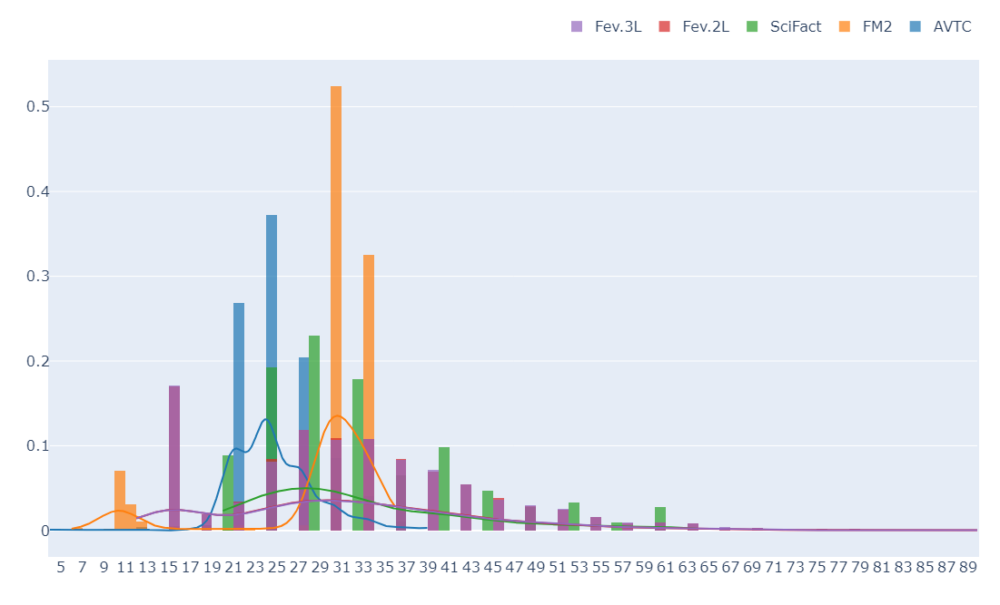

In [8]:
# histogram of unit_index with plotly without considering the type 'claim'
import plotly.figure_factory as ff

tdf = exp_df_0[only_ev_mask & lime_mask].copy()
# exclude dataset_name 'feverous_train_challenges_withnoise.jsonl'
tdf = tdf[tdf['dataset_name'] != 'feverous_train_challenges_withnoise.jsonl']
gdf = tdf.groupby(['id', 'dataset_name'], as_index=False).size()
# fig = px.histogram(gdf, x='size', title='Histogram of number of evidence per claim',
#                    labels={'size': 'n evidence', 'value': 'percentage'},
#                    color='dataset_name',
#                    hover_data=gdf.columns,
#                    # set color trasparency
#                    #   color_discrete_sequence=['rgba(0,0,0,0.5)']
# 
#                    )

pivot = gdf.pivot(index='id', columns='dataset_name', values='size')
fig = ff.create_distplot([pivot[col].dropna().values for col in pivot.columns],
                         pivot.columns, show_hist=True, show_rug=False,
                         )

fig.update_layout(**layout_dict, **h_legend_dict
                  )
# annotate the cumulative percentage of the unit_index only 1 decimal digits
# fig.update_traces(textposition='outside', text=gdf.value_counts(normalize=True).sort_index().values * 100,
#                   texttemplate='%{text:.1f}', textfont_size=10)

fig.update_xaxes(tick0=1, dtick=2)
fig = end_fig_func(fig)

fig.show()

save_fig(fig, '00-histogram_n_unit' + suffix)

In [9]:
# x = noise_df[(noise_df['type'] == 'evidence') & (noise_df['explainer_name'] == 'lime') & (
#             noise_df['model_name'] == 'models_fromjf270623or')].copy()
# x.groupby(['id', 'dataset_name', ],
#                                                                          as_index=False).size().pivot(index='id',
#                                                                                                       columns='dataset_name',
#                                                                                                       values='size')[
#     'feverous_train_challenges_withnoise.jsonl'].describe()

In [10]:
tdf.groupby(['id', 'dataset_name', ], as_index=False).size().groupby('dataset_name')['size'].describe()

,count,mean,std,min,25%,50%,75%,max
dataset_name,,,,,,,,
AVERITEC,474.0,24.721519,4.037677,4.0,21.0,24.0,27.0,39.0
FM2,1116.0,28.728495,7.061849,6.0,30.0,30.0,33.0,36.0
SciFact,214.0,32.355140,9.772292,20.0,24.0,28.0,36.0,64.0
feverous2l_full,1000.0,31.557000,12.463872,12.0,24.0,30.0,39.0,90.0
feverous3l_full,1000.0,31.683000,12.591388,12.0,24.0,30.0,39.0,90.0


# TIME stats

In [68]:
# table with maen, std of time for each model_name and explainer_name, dataset_name per explanation
# take 1st element of each group
first_elements = exp_df_0.copy().groupby(id_cols, as_index=False).first()
# apply xfc.charts.style.replace_words to the columns
tcols = ['explainer_name', 'dataset_name', 'model_name', ]
first_elements = sort_df(first_elements, tcols)
rename = xfc.charts.style.replace_words
first_elements = first_elements.rename(columns=rename)

tcols = [rename(x) for x in tcols]
for col in tcols:
    first_elements[col] = first_elements[col].apply(rename)

# compute the mean and std of time
time_stats = first_elements.groupby(tcols, as_index=False)['execution_time'].agg(['mean', 'std'])
time_stats = sort_df(time_stats, tcols)
# create a new col with mean and std between brackets with 2 decimal digits
time_stats['mean_std'] = time_stats.apply(lambda x: f"{x['mean']:.2f} ({x['std']:.1f})", 1)
# drop mean and std
time_stats = time_stats.drop(columns=['mean', 'std'])
# show a table with dataset_name in first level of column, mean and std of time in second level
# unstak the dataset_name
time_stats = time_stats.set_index(tcols).unstack(rename('dataset_name'))
# time_stats = time_stats.swaplevel(axis=1)
time_stats = time_stats.sort_index(axis=1, level=0)
# drop the first level of column
time_stats.columns = time_stats.columns.droplevel(0)

time_stats.to_csv(os.path.join(save_path, '00-time_stats.csv'))
print(time_stats.to_csv())

time_stats = time_stats.style.format(decimal=',', thousands='.', precision=2)
# I want vertical horizontal lines and the index name in bold
time_stats = time_stats.set_table_styles([
    {'selector': 'toprule', 'props': ':hline;'},
    {'selector': 'midrule', 'props': ':hline;'},
    {'selector': 'bottomrule', 'props': ':hline;'},
], overwrite=True)
#rename index 'explainer_name' to 'exp'
time_stats.index.names = [rename(x) for x in ['exp', 'model_name']]
txt = time_stats.to_latex(clines="skip-last;data",  )#column_format="|l|"+ "l|"*(len(time_stats.columns)+1)).replace('_', r'\_')
with open(os.path.join(save_path, '00-time_stats.tex'), 'w') as f:
    f.write(txt)
print(txt)

Explainer,Model,AVTC,FM2,Fev.2L,Fev.3L,SciFact
LIME,GFCE,60.96 (24.7),106.61 (1769.2),44.58 (126.0),44.17 (10.3),19.75 (2.3)
LIME,LLaMa,40.65 (10.0),45.55 (8.1),29.80 (19.5),42.63 (16.5),33.29 (13.1)
LIME,RoBERTa,9.74 (3.3),7.05 (1.6),8.96 (3.0),8.05 (3.0),6.34 (1.9)
SHAP,GFCE,65.72 (22.8),66.76 (13.9),51.33 (14.1),51.32 (13.9),55.49 (17.3)
SHAP,LLaMa,45.37 (11.2),56.04 (13.7),51.93 (18.3),53.28 (23.5),31.70 (17.4)
SHAP,RoBERTa,5.87 (3.5),6.37 (1.7),5.91 (3.6),6.11 (3.8),3.48 (3.0)

\begin{tabular}{lllllll}
\hline
 & Dataset & AVTC & FM2 & Fev.2L & Fev.3L & SciFact \\
exp & Model &  &  &  &  &  \\
\hline
\multirow[c]{3}{*}{LIME} & GFCE & 60.96 (24.7) & 106.61 (1769.2) & 44.58 (126.0) & 44.17 (10.3) & 19.75 (2.3) \\
 & LLaMa & 40.65 (10.0) & 45.55 (8.1) & 29.80 (19.5) & 42.63 (16.5) & 33.29 (13.1) \\
 & RoBERTa & 9.74 (3.3) & 7.05 (1.6) & 8.96 (3.0) & 8.05 (3.0) & 6.34 (1.9) \\
\cline{1-7}
\multirow[c]{3}{*}{SHAP} & GFCE & 65.72 (22.8) & 66.76 (13.9) & 51.33 (14.1) & 51.32 (13.9) & 55.4

In [32]:
first_elements.columns

['Explainer', 'Dataset', 'Model']

# Label distribution

In [12]:
first_elements = exp_df_0.copy().groupby(id_cols, as_index=False).first()
first_elements['label'] = first_elements.apply(lambda x: x['explainer_params__class_names'][x['label']], 1)
only_claim_mask = first_elements['explainer_name'] == 'claim_only_pred'
segment_cols = ['dataset_name', 'model_name']
ground_truth = first_elements.groupby(segment_cols, observed=False)['label'].value_counts(normalize=True)
ground_truth = ground_truth.to_frame().reset_index()
ground_truth['y'] = 'ground_truth'
predicted = first_elements[~only_claim_mask].groupby(segment_cols, observed=False)['predicted_label'].value_counts(
    normalize=True)
predicted = predicted.to_frame().reset_index().rename(columns={'predicted_label': 'label'})
predicted['y'] = 'predicted_label'
# only_claim_df = first_elements[only_claim_mask].copy()
# only_claim_df['label'] = only_claim_df.loc[:, class_names].idxmax(1)
# only_claim = only_claim_df.groupby(segment_cols, observed=False)['label'].value_counts(normalize=True)
# only_claim = only_claim.to_frame().reset_index()
# only_claim['y'] = 'predicted_label'

In [13]:
# label_stats = pd.concat([ground_truth, predicted, only_claim])
label_stats = pd.concat([ground_truth, predicted])

label_stats.index.names = label_stats.index.names[:-1] + ['class']
# fill combination of model_name and explainer_name with 0

# compute the mean by removing the dataset_name column
# label_stats = label_stats.groupby(level=[1, 2, 3]).mean()

# # stack and set name of the stacked column
# label_stats = label_stats.stack()
# # rename last level of index to type
# label_stats.index.set_names('type', level=-1, inplace=True)
# label_stats

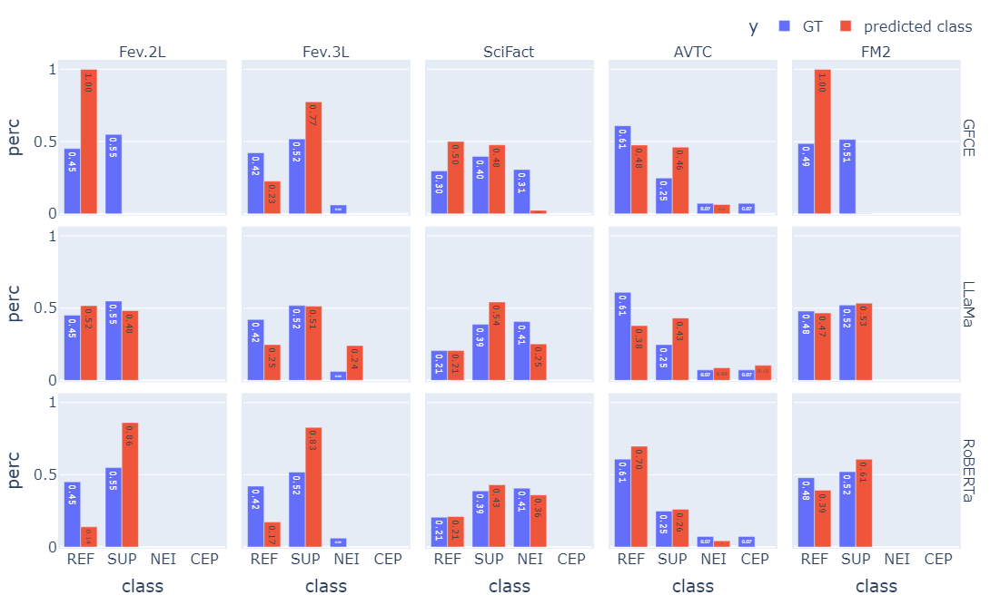

In [14]:
label_stats = label_stats.rename(columns={'proportion': 'perc', 'label': 'class'})
label_stats = sort_df(label_stats, ['y', 'dataset_name', 'class', ])
fig = px.bar(label_stats, x='class', y='perc', color='y', title='Distribution of labels over the evidence set',
             facet_col='dataset_name', facet_row='model_name',
             barmode='group',
             text='perc', )
fig = end_fig_func(fig)
fig.update_traces(texttemplate='%{text:.2f}', textposition='inside')
fig.update_layout(**layout_dict, **h_legend_dict)
# fix y title overlapping yticks


fig.show()
save_fig(fig, '00-label_stats' + suffix)
# label_stats = label_stats.set_index(['class', 'type', 'explainer_name', 'model_name']).unstack(['class'])
# save table as csv
label_stats.to_csv(os.path.join(save_path, '00-label_stats.csv'))

In [15]:
# explanation_df['predicted_label'].unique()
# # remove rows with CEP predicted_label
# explanation_df = explanation_df[explanation_df['predicted_label'] != 'CEP']

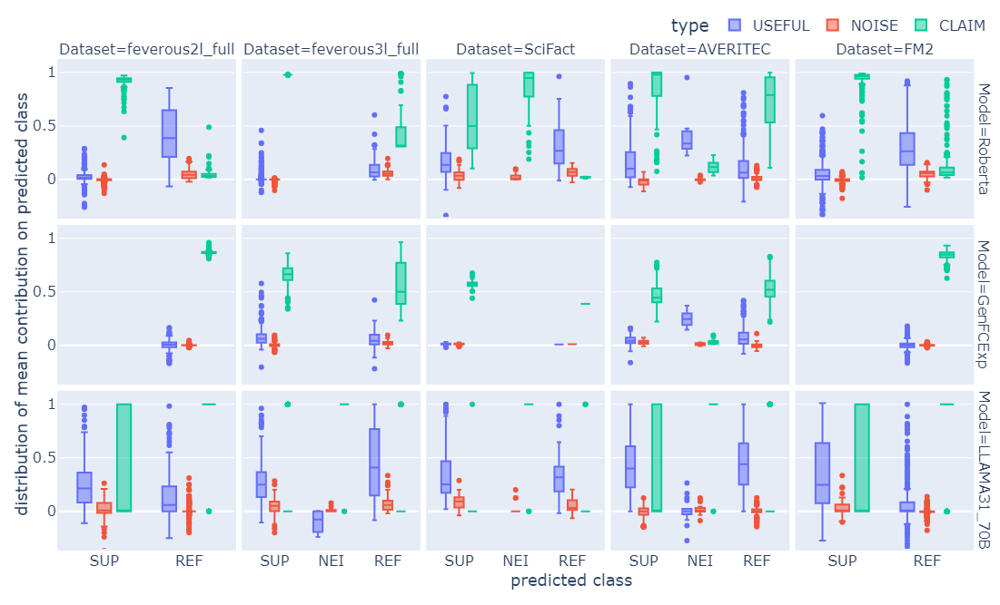

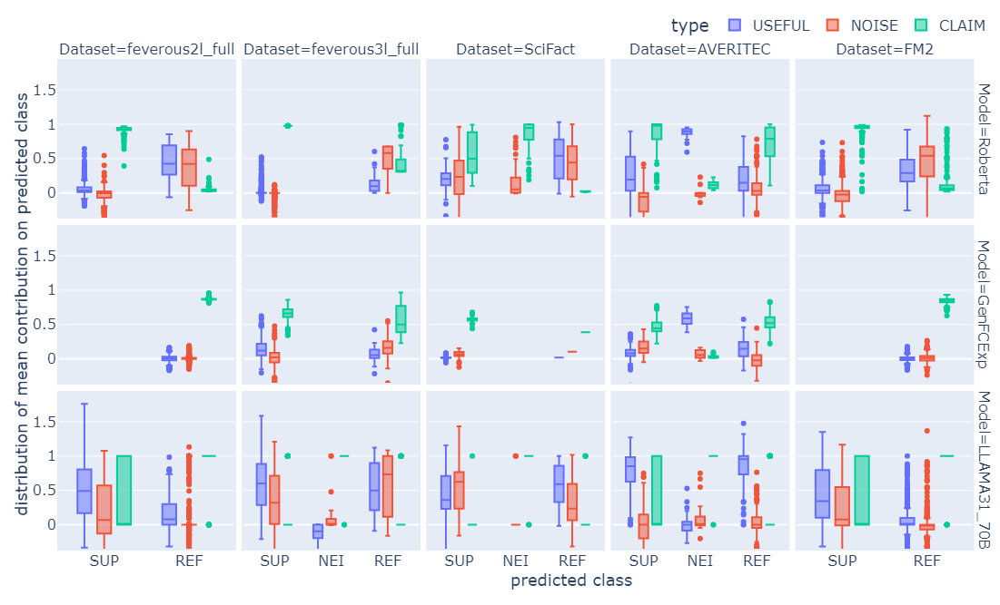

In [73]:

# boxplot of ['NOT ENOUGH INFO', 'SUPPORTS', 'REFUTES'] segmented by predicted_label and dataset_name. hue on type
# mask to select type evidence with goldtag 0 
texp_df = exp_df_0.copy()
texp_df = texp_df.query('predicted_label != "CEP"')
mask = (texp_df['type'] == 'evidence') & (texp_df['goldtag'] == 0)
texp_df.loc[mask, 'type'] = 'noise'

explainer_name = 'lime'
lime_mask = texp_df['explainer_name'] == explainer_name
shap_mask = texp_df['explainer_name'] == 'shap'
true_mask = texp_df['label'] == texp_df['predicted_label_int']
false_mask = ~true_mask
all_mask = [True] * len(texp_df)

for (e_mask, e_name), (t_mask, t_name), (op, op_name) in it.product([(lime_mask, 'lime'), (shap_mask, 'shap')],
                                                                    [(true_mask, 'true_el'),
                                                                     (all_mask, 'all'),
                                                                     (false_mask, 'false_el')],
                                                                    [('mean', 'MEAN'), ('sum', 'SUM')]):
    tdf_g = \
        texp_df[e_mask & t_mask].copy().groupby(id_cols + ['type', 'predicted_label'], as_index=False, observed=True)[
            list(class_names) + ['score_on_predicted_label']].agg(op)
    tdf_g = tdf_g[~((tdf_g['predicted_label'] == 'NEI') & (tdf_g['dataset_name'].isin(['FM2', 'feverous2l_full'])))]
    tdf_g = tdf_g[tdf_g['dataset_name'] != 'ex_AB_00.jsonl']
    # select claim_only_pred explainer_name and duplicate it for the other explainer_name
    claim_only_pred = tdf_g[tdf_g['explainer_name'] == 'claim_only_pred']
    tdf_g = tdf_g[tdf_g['explainer_name'] != 'claim_only_pred']
    for explainer_name in tdf_g['explainer_name'].unique():
        claim_only_pred['explainer_name'] = explainer_name
        tdf_g = pd.concat([tdf_g, claim_only_pred])

    tdf_g = sort_df(tdf_g, ['predicted_label', 'explainer_name', 'type', 'dataset_name', 'model_name', ])

    fig = px.box(tdf_g, x='predicted_label', y='score_on_predicted_label',
                 title=f'Box plot of SUM of scores over class predicted class',
                 labels=xfc.charts.style.rename_word_dict,
                 color='type',
                 facet_row='model_name', facet_col='dataset_name',
                 facet_row_spacing=0.02, facet_col_spacing=0.01,
                 # shared_xaxes=False,
                 # category_orders={'predicted_label': class_names},

                 # orientation='h',
                 # boxmode='overlay',

                 )
    # fig.update_xaxes(matches='x')
    fig.update_xaxes(categoryarray=['SUP', 'NEI', 'REF'])
    y_title = 'distribution of mean contribution on predicted class'
    # y_title = copy.deepcopy(fig.layout.yaxis.title.text)
    fig.for_each_yaxis(lambda y: y.update({'title': ''}))

    fig.add_annotation(showarrow=False, xanchor='left', yanchor='middle', xref='paper', x=-0.055, yref='paper', y=0.5,
                       textangle=-90,
                       text=y_title,
                       #font size as other
                       font=dict(size=18),
                       )
    x_title = copy.deepcopy(fig.layout.xaxis.title.text)
    fig.for_each_xaxis(lambda x: x.update({'title': ''}))
    fig.add_annotation(showarrow=False, xanchor='center', yanchor='bottom', xref='paper', x=0.55, yref='paper',
                       y=-.09,
                       text=x_title,
                       #font size as other
                       font=dict(size=18),
                       )
    # add annottation to y axis at left horizontally, center vertically wrt the figure 
    # fig.add_annotation(
    #     showarrow=False, xanchor='left', yanchor='top', xref='paper',
    #     x=0, yref='paper', y=1.10, textangle=0, text=f'y_title',
    #     font=dict(size=18),
    # )

    fig.update_layout(**layout_dict | {'width': 1200}, **h_legend_dict, )
    fig.update_layout(margin=dict(l=65, r=10,  # b=0, t=0
                                  ),  # boxgap=0.1, boxgroupgap=0.1,
                      )
    # increase left margin to avoid overlapping    
    fig = end_fig_func(fig)
    # show if shap and true_el
    if e_name == 'shap' and t_name == 'true_el':
        # fig.update_yaxes(matches=None,)
        fig.update_xaxes(matches=None, )
        minallowed_list = [None, -.35, -.7]
        maxallowed_list = [1.8, None, None]
        fig.update_yaxes(minallowed=-.35)

        [fig.update_xaxes(col=x, row=1, categoryarray=['SUP', 'REF']) for x in [1, 5]]
        # fig.update_layout(yaxis6=dict(minallowed=minallowed_list[1]))
        # fig.update_layout(yaxis=dict(maxallowed=maxallowed_list[0]))
        for row in range(1, 4):
            for col in range(1, 7):
                to_match = (row - 1) * 5 + 1
                to_match = '' if to_match == 1 else to_match

                # fig.update_yaxes(row=row, col=col, matches=f'y{to_match}', autorange=True, minallowed=minallowed_list[row-1], maxallowed=maxallowed_list[row-1])
                to_match = col
                to_match = '' if to_match == 1 else to_match
                # print(dict(row=row, col=col, matches=f'x{to_match}'))
                fig.update_xaxes(row=row, col=col, matches=f'x{to_match}')  #, title=f'r{row} - c {col}')
        fig.show()

    save_fig(fig, f'03-boxplot_on_predicted_label_ev_{op_name}_{e_name}_{t_name}' + suffix)
    # break

    # fig = px.box(tdf_g, x='predicted_label', y=[value_col],
    #              title=f'Box plot of SUM scores over class {value_col}',
    #              labels={'predicted_label': 'predicted_label', 'value': 'quantiles'},
    #              color='type',
    #              hover_data=["model_name"],
    #              category_orders={'predicted_label': class_names},
    #              facet_col='dataset_name',
    #              facet_row='explainer_name',
    #              )
    # fig.update_layout(**layout_dict, **h_legend_dict)
    # # save_fig(fig, f'01-boxplot_{value_col}' + suffix)
    # fig.show()
    # save_fig(fig, f'03-boxplot_{value_col}_by_dataset_name_ev_SUM' + suffix)


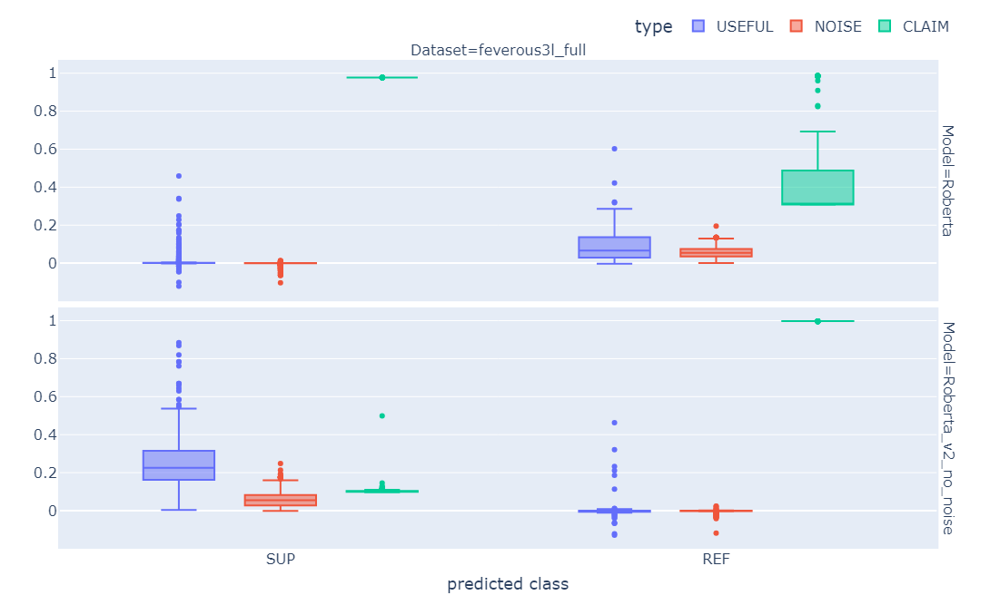

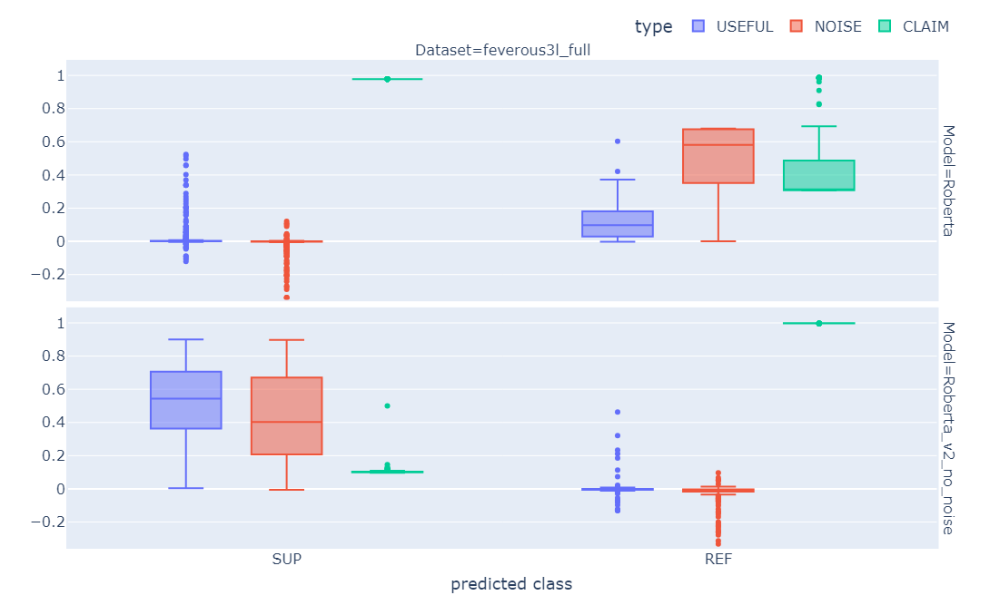

In [86]:
texp_df = xfc.charts.explanations_loader.load_preprocess_explanations(experiment_code_list=[
        # 'fv_f2lF_1.0',
        # 'fv_f2lF_2.0',
        'fv_f3lF_1.0',
        'fv_f3lF_2.0',

        # 'r2_fv_f2lF_1.0', # no noise
        # 'r2_fv_f2lF_2.0', # no noise
        'r2_fv_f3lF_1.0', # no noise
        'r2_fv_f3lF_2.0', # no noise

    ] )
texp_df = texp_df.query('predicted_label != "CEP"')
texp_df['type'] = texp_df['type'].astype('str')
mask = (texp_df['type'] == 'evidence') & (texp_df['goldtag'] == 0)
texp_df.loc[mask, 'type'] = 'noise'

explainer_name = 'lime'
lime_mask = texp_df['explainer_name'] == explainer_name
shap_mask = texp_df['explainer_name'] == 'shap'
true_mask = texp_df['label'] == texp_df['predicted_label_int']
false_mask = ~true_mask
all_mask = [True] * len(texp_df)

for (e_mask, e_name), (t_mask, t_name), (op, op_name) in it.product([(lime_mask, 'lime'), (shap_mask, 'shap')],
                                                                    [(true_mask, 'true_el'),
                                                                     (all_mask, 'all'),
                                                                     (false_mask, 'false_el')],
                                                                    [('mean', 'MEAN'), ('sum', 'SUM')]):
    tdf_g = \
        texp_df[e_mask & t_mask].copy().groupby(id_cols + ['type', 'predicted_label'], as_index=False, observed=True)[
            list(class_names) + ['score_on_predicted_label']].agg(op)
    tdf_g = tdf_g[~((tdf_g['predicted_label'] == 'NEI') & (tdf_g['dataset_name'].isin(['FM2', 'feverous2l_full'])))]
    tdf_g = tdf_g[tdf_g['dataset_name'] != 'ex_AB_00.jsonl']
    # select claim_only_pred explainer_name and duplicate it for the other explainer_name
    claim_only_pred = tdf_g[tdf_g['explainer_name'] == 'claim_only_pred']
    tdf_g = tdf_g[tdf_g['explainer_name'] != 'claim_only_pred']
    for explainer_name in tdf_g['explainer_name'].unique():
        claim_only_pred['explainer_name'] = explainer_name
        tdf_g = pd.concat([tdf_g, claim_only_pred])

    tdf_g = sort_df(tdf_g, ['predicted_label', 'explainer_name', 'type', 'dataset_name', 'model_name', ])

    fig = px.box(tdf_g, x='predicted_label', y='score_on_predicted_label',
                 title=f'Box plot of SUM of scores over class predicted class',
                 labels=xfc.charts.style.rename_word_dict,
                 color='type',
                 facet_row='model_name', facet_col='dataset_name',
                 facet_row_spacing=0.02, facet_col_spacing=0.01,
                 # shared_xaxes=False,
                 # category_orders={'predicted_label': class_names},

                 # orientation='h',
                 # boxmode='overlay',

                 )
    # fig.update_xaxes(matches='x')
    fig.update_xaxes(categoryarray=['SUP', 'NEI', 'REF'])
    y_title = 'distribution of mean contribution on predicted class'
    # y_title = copy.deepcopy(fig.layout.yaxis.title.text)
    fig.for_each_yaxis(lambda y: y.update({'title': ''}))

    fig.add_annotation(showarrow=False, xanchor='left', yanchor='middle', xref='paper', x=-0.21, yref='paper', y=0.5,
                       textangle=-90,
                       text=y_title,
                       #font size as other
                       font=dict(size=18),
                       )
    x_title = copy.deepcopy(fig.layout.xaxis.title.text)
    fig.for_each_xaxis(lambda x: x.update({'title': ''}))
    fig.add_annotation(showarrow=False, xanchor='center', yanchor='bottom', xref='paper', x=0.5, yref='paper',
                       y=-.1,
                       text=x_title,
                       #font size as other
                       font=dict(size=18),
                       )
    # add annottation to y axis at left horizontally, center vertically wrt the figure 
    # fig.add_annotation(
    #     showarrow=False, xanchor='left', yanchor='top', xref='paper',
    #     x=0, yref='paper', y=1.10, textangle=0, text=f'y_title',
    #     font=dict(size=18),
    # )

    fig.update_layout(**layout_dict | {'width': 1200//3, 'height': pixel_height}, **h_legend_dict, )
    fig.update_layout(margin=dict(l=65, r=50,  # b=0, t=0
                                  ),  # boxgap=0.1, boxgroupgap=0.1,
                      )
    # increase left margin to avoid overlapping    
    fig = end_fig_func(fig)
    # show if shap and true_el
    if e_name == 'shap' and t_name == 'true_el':
        # fig.update_yaxes(matches=None,)
        fig.update_xaxes(matches=None, )
        minallowed_list = [None, -.35, -.7]
        maxallowed_list = [1.8, None, None]
        fig.update_yaxes(minallowed=-.35)

        [fig.update_xaxes(col=x, row=1, categoryarray=['SUP', 'REF']) for x in [1, 5]]
        # fig.update_layout(yaxis6=dict(minallowed=minallowed_list[1]))
        # fig.update_layout(yaxis=dict(maxallowed=maxallowed_list[0]))
        for row in range(1, 4):
            for col in range(1, 7):
                to_match = (row - 1) * 5 + 1
                to_match = '' if to_match == 1 else to_match

                # fig.update_yaxes(row=row, col=col, matches=f'y{to_match}', autorange=True, minallowed=minallowed_list[row-1], maxallowed=maxallowed_list[row-1])
                to_match = col
                to_match = '' if to_match == 1 else to_match
                # print(dict(row=row, col=col, matches=f'x{to_match}'))
                fig.update_xaxes(row=row, col=col, matches=f'x{to_match}')  #, title=f'r{row} - c {col}')
        fig.show()

    save_fig(fig, f'03-z_boxplot_on_predicted_label_ev_{op_name}_{e_name}_{t_name}_Noise_vs_NNoise' + suffix)

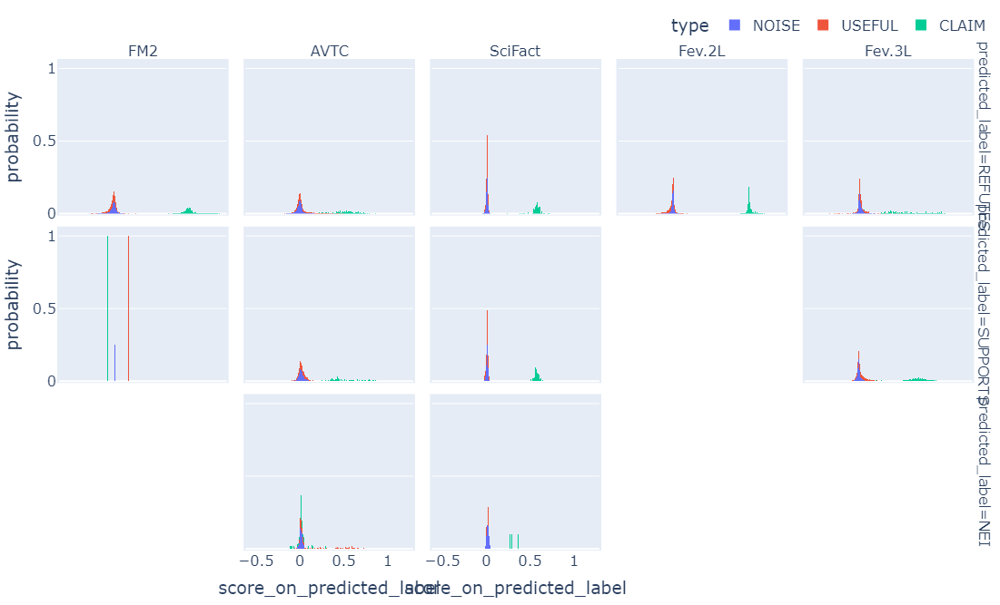

In [17]:
tdf = exp_df_0.copy()
tdf = tdf.query('predicted_label != "CEP"')
# filter model_name == GenFCExp
tdf = tdf[tdf['model_name'] == 'GenFCExp']
mask = (tdf['type'] == 'evidence') & (tdf['goldtag'] == 0)
tdf.loc[mask, 'type'] = 'noise'
# distribution (histogram) of score_on_predicted_label
fig = px.histogram(tdf, x='score_on_predicted_label', color='type',
                   title='Histogram of score_on_predicted_label',
                   labels={'score_on_predicted_label': 'score_on_predicted_label', 'value': 'percentage'},
                   facet_col='dataset_name', facet_row='predicted_label',
                   # set color trasparency
                   #   color_discrete_sequence=['rgba(0,0,0,0.5)']
                   # normalize
                     histnorm='probability',
                   # add kde
                     marginal='box',
                   )
fig.update_layout(**layout_dict | {'width': 1000}, **h_legend_dict, )
fig.update_layout(margin=dict(l=65, r=10,  # b=0, t=0
                              ),  # boxgap=0.1, boxgroupgap=0.1,
                  )
# increase left margin to avoid overlapping    
fig = end_fig_func(fig)
fig.show()

In [18]:
# fig.update_xaxes(matches=None,)
# fig.update_xaxes(col=[1,6], categoryarray=['SUP','REF'])

In [19]:
# set yaxis range to -1, 1 for all the boxplot
# fig.update_yaxes(range=[-1, .5], row=1, col=1, matches='y',)
# fig.update_yaxes( row=1, col=2, matches='y2', range=[-.5, 1],)
# fig.update_yaxes(matches=None,)
# minallowed_list= [None, -.3,None]
# maxallowed_list = [1.55, None, None]
# fig.update_layout(yaxis6=dict(minallowed=-.3,))
# fig.update_layout(yaxis=dict(maxallowed=1.55))
# for row in range(1,4):
#     for col in range(1,7):
#         to_match = (row-1)*5 + 1
#         to_match = '' if to_match == 1 else to_match
#         print(dict(row=row, col=col, matches=f'y{to_match}'))
#         fig.update_yaxes(row=row, col=col, matches=f'y{to_match}', autorange=True, minallowed=minallowed_list[row-1])
# # fig.update_yaxes(range=[-1, 1], row=1, col=3)
# # fig.update_yaxes(range=[-1, 1], row=1, col=4)
# # fig.update_layout(yaxis=dict(range=[-.5, 0.2]))
# # fig.update_layout(yaxis=dict(range=[-1, 1]))
# fig


In [20]:
# filter dataset_name 'feverous3l'
texp_df[texp_df['dataset_name'] == 'SciFact'].groupby('id').first()['predicted_label'].value_counts()

predicted_label
SUPPORTS    116
NEI          54
REFUTES      44
Name: count, dtype: int64

# Q1.bis Is the model using the evidence or only the claim?

In [21]:
# select refutes predicted_label and only_claim type, describe the score_on_predicted_label for model_name and explainer_name
tdf_g[(tdf_g['predicted_label'] == 'REFUTES') & (tdf_g['type'] == 'only_claim')].groupby(
    ['model_name', 'explainer_name'])[['score_on_predicted_label', 'REFUTES']].describe()

Empty DataFrame
Columns: [(score_on_predicted_label, count), (score_on_predicted_label, mean), (score_on_predicted_label, std), (score_on_predicted_label, min), (score_on_predicted_label, 25%), (score_on_predicted_label, 50%), (score_on_predicted_label, 75%), (score_on_predicted_label, max), (REFUTES, count), (REFUTES, mean), (REFUTES, std), (REFUTES, min), (REFUTES, 25%), (REFUTES, 50%), (REFUTES, 75%), (REFUTES, max)]
Index: []

01-distplot_GenFCExp_shap


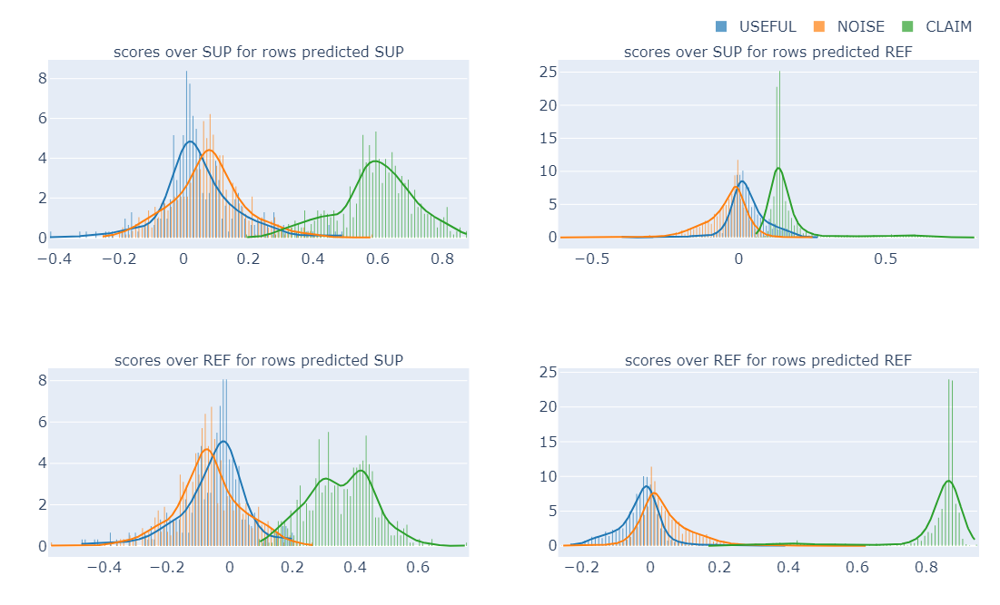

01-distplot_LLAMA31_70B_shap


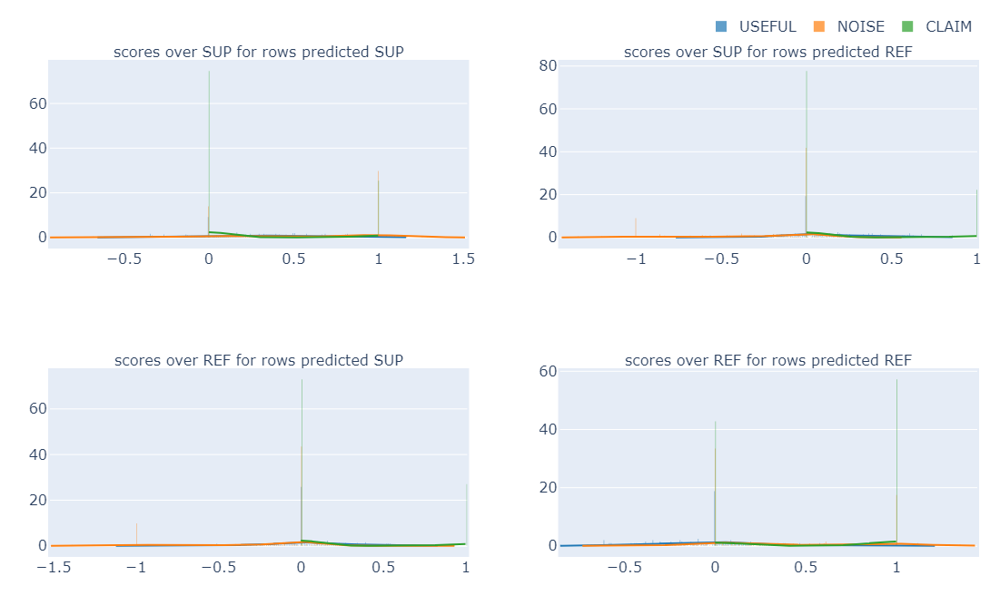

01-distplot_Roberta_shap


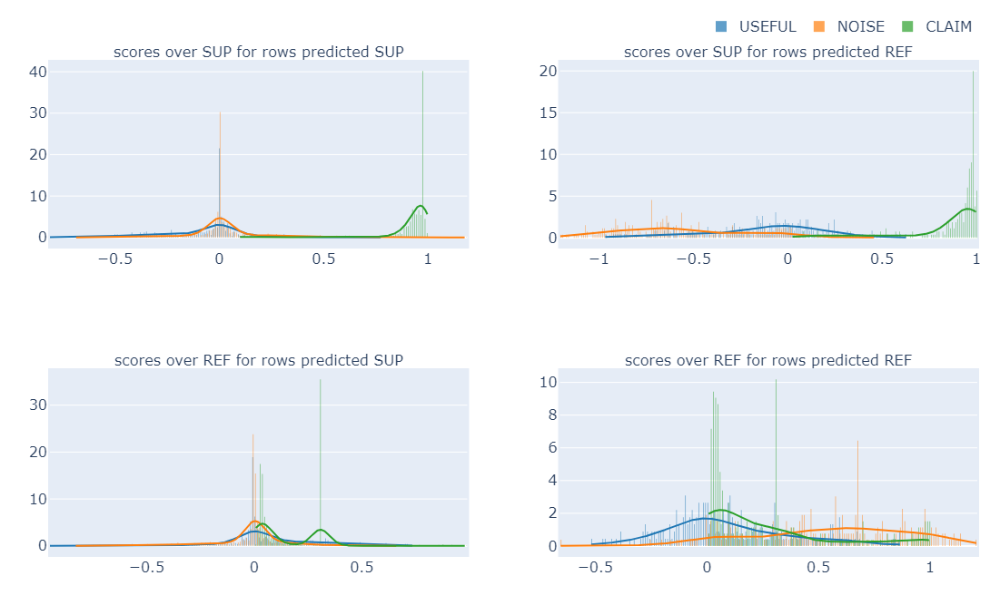

In [22]:
plot_rows = 2
plot_cols = 2

df3 = tdf_g.copy()
# exclude only_claim 
df3 = df3[df3['type'] != 'only_claim']

# select elements with predicted_label 'SUPPORTS'
for keys, group_df in df3.groupby(['model_name', 'explainer_name']):
    model_name, explainer_name = keys
    fig = make_subplots(rows=plot_rows, cols=plot_cols,
                        subplot_titles=[str(i) for i in range(1, plot_rows * plot_cols + 1)])
    title_list = []
    for r_new, reference_class in enumerate(['SUPPORTS', 'REFUTES']):
        r_new += 1
        for c_new, predicted_label in enumerate(['SUPPORTS', 'REFUTES']):
            c_new += 1
            tmp = group_df[group_df['predicted_label'] == predicted_label]
            pivot = tmp.pivot(index=id_cols  #+ ['unit_index']
                              , columns='type', values=reference_class, )
            pivot = pivot[[x for x in columns_order_map['type'].keys() if x in pivot.columns]]

            # display(pivot.describe())
            dist_fig = ff.create_distplot([pivot[col].dropna().values for col in pivot.columns],
                                          pivot.columns, show_hist=True, show_rug=False, show_curve=True,
                                          histnorm='probability density',
                                          bin_size=0.01
                                          )
            for trace in dist_fig.select_traces():
                if c_new + r_new != 2:
                    trace.showlegend = False
                fig.add_trace(trace, row=r_new, col=c_new)

            # update yaxes range if y sup limit is over 8
            #get y axes limits
            # if max_value > 8:
            #     fig.update_yaxes(range=[0, 8], row=r, col=c)
            # add a title to the subplot
            title_list += [f'scores over {reference_class} for rows predicted {predicted_label}']

    names = {str(i + 1): name for i, name in enumerate(title_list)}

    fig.for_each_annotation(lambda a: a.update(text=names[a.text]))
    fig.update_layout(**layout_dict, **h_legend_dict)
    print(f'01-distplot_{model_name}_{explainer_name}')
    fig.update_layout(title=f'{explainer_name} {model_name} distribution of scores over the evidence set')
    fig = end_fig_func(fig)
    fig.show()

    save_fig(fig, f'04-distplot_evidence_{model_name}_{explainer_name}' + suffix)

# Q3 Is the order affecting the impact of evidence?
# Is the claim more important than the evidence?

/home/bussotti/.conda/envs/feverous2/lib/python3.10/site-packages/numpy/core/_methods.py:269: RuntimeWarning:

Degrees of freedom <= 0 for slice

/home/bussotti/.conda/envs/feverous2/lib/python3.10/site-packages/numpy/core/_methods.py:261: RuntimeWarning:

invalid value encountered in scalar divide

/home/bussotti/.conda/envs/feverous2/lib/python3.10/site-packages/scipy/stats/_distn_infrastructure.py:2351: RuntimeWarning:

invalid value encountered in multiply

/home/bussotti/.conda/envs/feverous2/lib/python3.10/site-packages/scipy/stats/_distn_infrastructure.py:2352: RuntimeWarning:

invalid value encountered in multiply



01-CEP_mean_ci


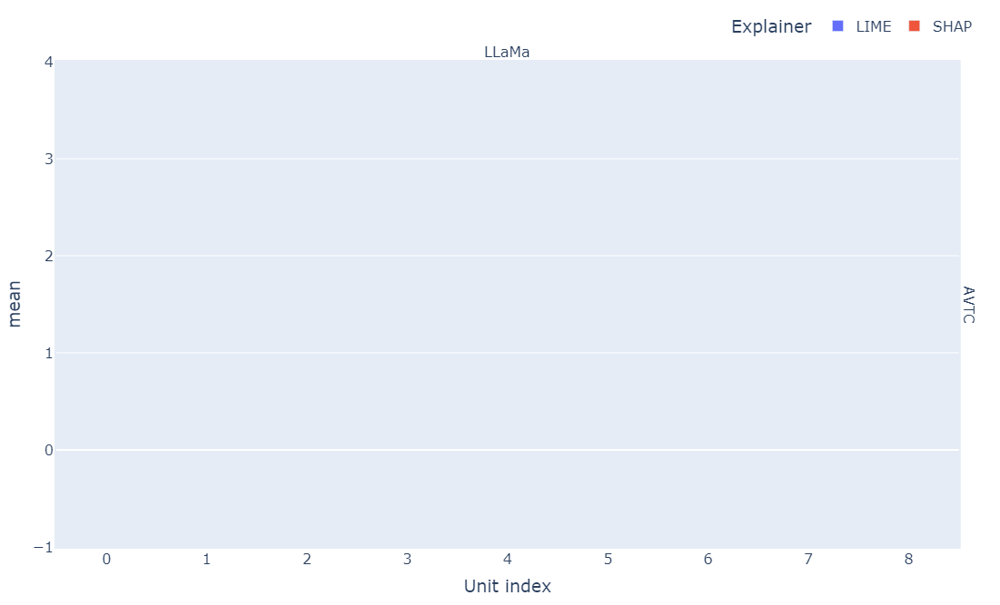

01-NEI_mean_ci


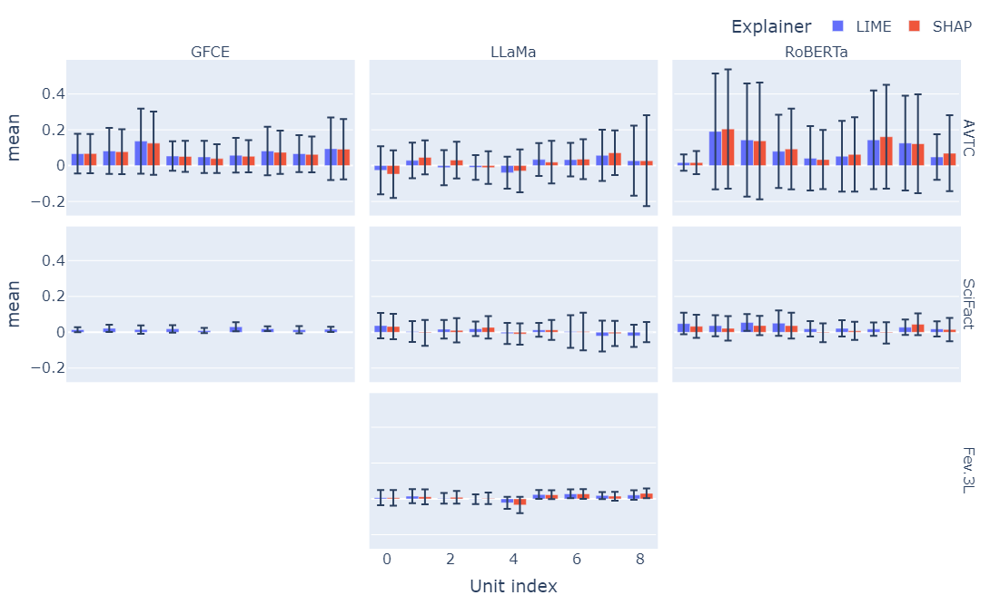

01-REFUTES_mean_ci


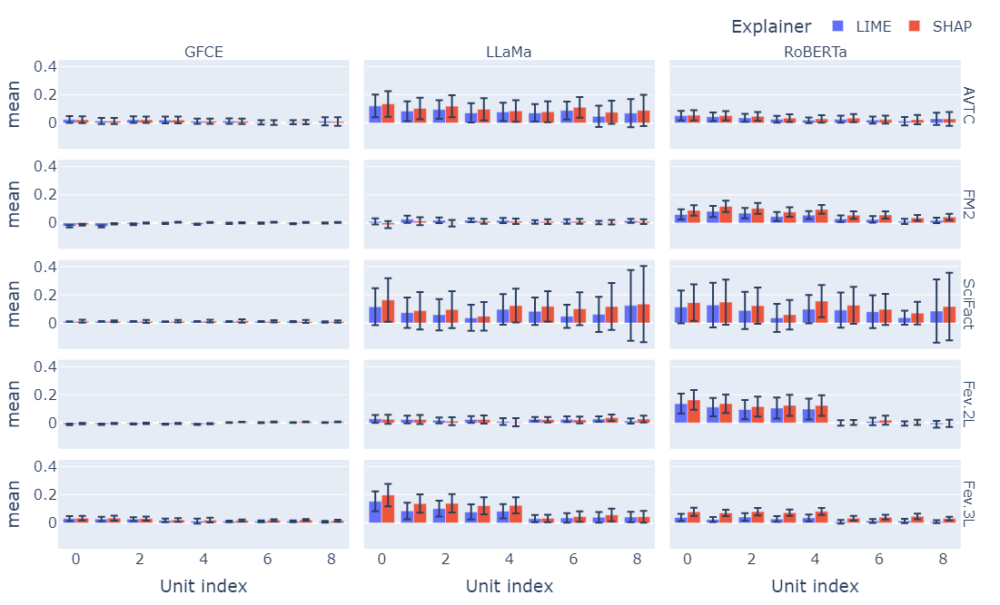

01-SUPPORTS_mean_ci


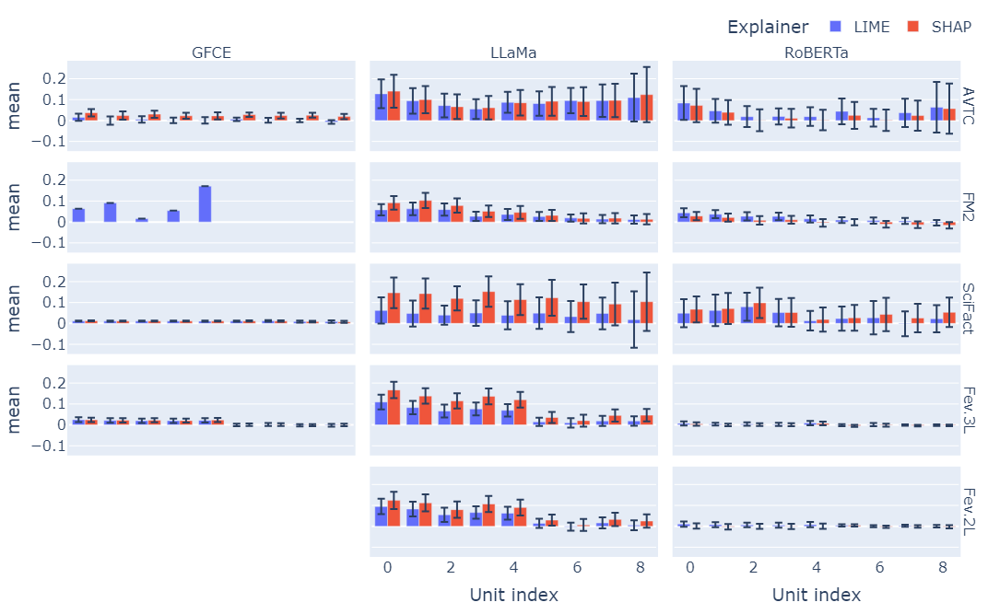

In [23]:
to_group = ['type', 'unit_index', 'predicted_label', 'explainer_name', 'model_name', 'dataset_name']
df4 = exp_df_0.copy()
df4 = df4[df4['dataset_name'] != 'ex_AB_00.jsonl']
df4 = df4[df4['type'] != 'only_claim']
df4 = df4[df4[
              'dataset_name'] != 'feverous_train_challenges_withnoise.jsonl']  # remove noise because it's always at the end
grouped_df = df4.groupby(to_group)['score_on_predicted_label'].agg(
    ['mean', 'std', ('mean_ci', xfc.xfc_utils.mean_confidence_interval), 'size']).reset_index()
# cut unit_index greater than 10
grouped_df = grouped_df[grouped_df['unit_index'] <= 8]
# filter type 'evidence'
grouped_df = grouped_df[grouped_df['type'] == 'evidence']

for tpredicted_label in grouped_df['predicted_label'].unique():
    # fig = px.bar(grouped_df[grouped_df['predicted_label']==tdf], x=['type','unit_index'], y='mean', color='type', error_y='std',
    #              )
    # set the title as the predicted_label
    fig = px.bar(grouped_df[grouped_df['predicted_label'] == tpredicted_label], x='unit_index', y='mean',
                 color='explainer_name',
                 error_y='mean_ci',
                 title=f'{tpredicted_label} mean and 95% confidence interval of score_on_predicted_label',
                 facet_row='dataset_name', facet_col='model_name',
                 labels=xfc.charts.style.rename_word_dict,
                 )

    # do not vertical stack the bars
    fig.update_layout(barmode='group',
                      **layout_dict, **h_legend_dict)

    fig = end_fig_func(fig)
    save_fig(fig, f'01-{tpredicted_label}_mean_ci' + suffix)
    print(f'01-{tpredicted_label}_mean_ci')
    fig.show()

# the same but with std as error bar, explain the chart in the title
# for tpredicted_label in grouped_df['predicted_label'].unique():
#     name = f'{tpredicted_label} mean and std of score_on_predicted_label'
#     fig = px.bar(grouped_df[grouped_df['predicted_label'] == tpredicted_label], x='unit_index', y='mean', color='type',
#                  error_y='std',
#                  title=name,
#                  facet_row='explainer_name', facet_col='model_name'
#                  )
#     fig.update_layout(barmode='group',
#                       **layout_dict, **h_legend_dict)
# 
#     fig = end_fig_func(fig)
#     save_fig(fig, f'01-{tpredicted_label}_mean_std' + suffix)
#     fig.show()


In [24]:
exp_df_0.groupby('dataset_name')['id'].nunique()

dataset_name
AVERITEC            474
FM2                1116
SciFact             214
feverous2l_full    1000
feverous3l_full    1000
Name: id, dtype: int64

In [25]:
exp_df_0[exp_df_0['dataset_name'] == 'feverous2l'].groupby('id')['unit_index'].max().value_counts()

Series([], Name: count, dtype: int64)

In [26]:
# describe() of evidence of type claim
tdf = exp_df_0[exp_df_0['type'] == 'claim_intercept'].copy()
tdf.groupby('predicted_label')['score_on_predicted_label'].describe()

,count,mean,std,min,25%,50%,75%,max
predicted_label,,,,,,,,
CEP,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NEI,934.0,0.756539,0.354843,-0.228460,0.600316,0.973041,1.000000,1.228791
REFUTES,10412.0,0.677627,0.342070,-0.594651,0.459409,0.847734,0.908538,1.433203
SUPPORTS,11100.0,0.659276,0.352212,-0.583054,0.484348,0.781921,0.959679,1.222818


## Discussion

# Q1 Does the approach rely on the entire body of evidence or only select pieces?

/home/bussotti/.conda/envs/feverous2/lib/python3.10/site-packages/numpy/core/_methods.py:269: RuntimeWarning:

Degrees of freedom <= 0 for slice

/home/bussotti/.conda/envs/feverous2/lib/python3.10/site-packages/numpy/core/_methods.py:261: RuntimeWarning:

invalid value encountered in scalar divide



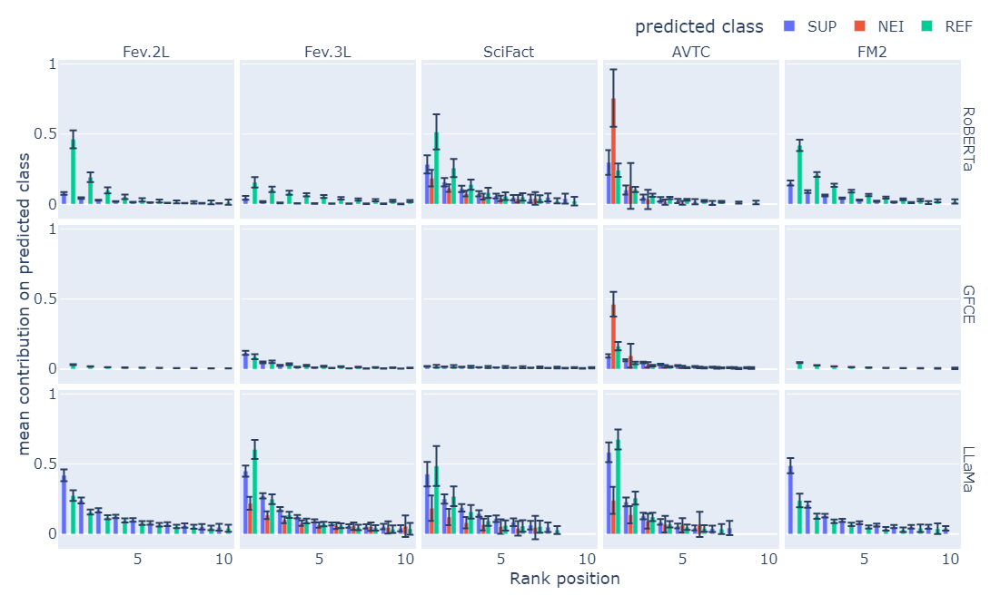

In [27]:
only_evidence_mask = exp_df_0['type'] == 'evidence'
tdf = exp_df_0[only_evidence_mask].copy()
# filter only positive scores
tdf = tdf[tdf['score_on_predicted_label'] > 0]
# tdf = tdf.groupby(['type', 'unit_index', 'predicted_label', 'explainer_name', 'model_name']).filter(lambda x: len(x) > 10)
tdf['score_percentage'] = tdf['score_on_predicted_label'] / tdf.groupby(id_cols)['score_on_predicted_label'].transform(
    'sum') * 100

# sort impact id_cols and score_on_predicted_label
tdf.sort_values(by=id_cols + ['score_on_predicted_label'], ascending=False, inplace=True)
# cumulative sum starting from the highest score_percentage by id
tdf['cumsum_score_percentage'] = tdf.groupby(id_cols)['score_percentage'].transform('cumsum')
# save the ordered index of the score_percentage
tdf['rank_score'] = tdf.groupby(id_cols)['score_on_predicted_label'].transform(
    lambda x: x.rank(ascending=False, method='first'))
# cut rank greater than 10
tdf = tdf[tdf['rank_score'] <= 10]
# group by rank_score and calculate the mean, std and confindence interval of the score_percentage
# grouped_df = tdf.groupby('rank_score')[col_to_plot].agg(
#     ['mean', 'std', ('mean_ci', xfc.xfc_utils.mean_confidence_interval)]).reset_index()

fig = go.Figure()

explainer_name = 'lime'
lime_mask = tdf['explainer_name'] == explainer_name
shap_mask = tdf['explainer_name'] == 'shap'
true_mask = tdf['label'] == tdf['predicted_label_int']
false_mask = ~true_mask
all_mask = [True] * len(texp_df)

col_to_plot = 'score_on_predicted_label'
# col_to_plot = 'score_percentage'
# col_to_plot = 'cumsum_score_percentage'
# add a line for each predicted_la

# for tpredicted_label in tdf['predicted_label'].unique():
#     # filter the predicted_label
# tdf_predicted = tdf[tdf['predicted_label'] == tpredicted_label]
tgroup_df = tdf[shap_mask].groupby(['predicted_label', 'dataset_name', 'model_name', 'rank_score'])[col_to_plot].agg(
    ['mean', 'std', ('mean_ci', xfc.xfc_utils.mean_confidence_interval), 'size']).reset_index()
# filter only rank_score with more than 5 samples

tgroup_df = tgroup_df[tgroup_df['size'] > 5]
tgroup_df = sort_df(tgroup_df, [ 'dataset_name', 'model_name', 'predicted_label', ])
fig = px.bar(tgroup_df, x='rank_score', y='mean', color='predicted_label', 
             error_y='mean_ci',
             # title=tpredicted_label + '_ci',
             facet_row='model_name', facet_col='dataset_name',
             labels=xfc.charts.style.rename_word_dict,
             facet_col_spacing=0.01, facet_row_spacing=0.02,
             )
fig.update_layout(barmode='group', title='score_on_predicted_label over the ranked evidence (mean, 95% ci)',
                  **layout_dict, **h_legend_dict, )

y_title = copy.deepcopy(fig.layout.yaxis.title.text)
y_title = 'mean contribution on predicted class'
fig.for_each_yaxis(lambda y: y.update({'title': ''}))

fig.add_annotation(showarrow=False, xanchor='left', yanchor='middle', xref='paper', x=-0.055, yref='paper', y=0.5,
                   textangle=-90,
                   text=y_title,
                   #font size as other
                   font=dict(size=18),
                   )
x_title = copy.deepcopy(fig.layout.xaxis.title.text)
fig.for_each_xaxis(lambda x: x.update({'title': ''}))
fig.add_annotation(showarrow=False, xanchor='center', yanchor='bottom', xref='paper', x=0.55, yref='paper',
                   y=-.09,
                   text=x_title,
                   #font size as other
                   font=dict(size=18),
                   )
fig = end_fig_func(fig)
fig.show()
save_fig(fig, f'Qsel-score_on_predicted_label_ranked_evidence' + suffix)

# # same chart replicated for each dataset_name
# for dataset_name in tdf['dataset_name'].unique():
#     if dataset_name == 'ex_AB_00':
#         continue
#     fig = go.Figure()
#     for tpredicted_label in tdf['predicted_label'].unique():
#         # filter the predicted_label
#         tdf_predicted = tdf[
#             (tdf['predicted_label'] == tpredicted_label) & (tdf['dataset_name'] == dataset_name)]
#         tdf_predicted = tdf_predicted.groupby('rank_score').filter(lambda x: len(x) > 5)
#         tgroup_df = tdf_predicted.groupby('rank_score')[col_to_plot].agg(
#             ['mean', 'std', ('mean_ci', xfc.xfc_utils.mean_confidence_interval)]).reset_index()
#         # add_custom_trace(fig, tgroup_df['rank_score'], tgroup_df['mean'], tgroup_df['std'], tpredicted_label + '_std')
#         add_custom_trace(fig, tgroup_df['rank_score'], tgroup_df['mean'], tgroup_df['mean_ci'],
#                          tpredicted_label + '_ci')
#     fig.update_layout(title=f'{dataset_name} score_on_predicted_label over the ranked evidence (mean, std)',
#                       **layout_dict, **h_legend_dict)
#     save_fig(fig, f'02-{dataset_name}_score_on_predicted_label_ranked_evidence' + suffix)
#     fig.show()
